In [236]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt

When we take a photo on a camera, we 'convert' the scene's world coordinate, into the view / camera coordinate frame, where the camera is at the center, looking down on either the +z or -z axis. Then, we apply the projection matrix and perspective divide to go from the view space onto pixel space.

Our goal is the estimate the relative objects in the image, given camera calibaration parameters and a pair of stereo (i.e left and right images).
Essentially, we try to estimate the world coordinates of different pixels in the image.

**Stereo Vision System** : It consist of two cameras located at a known distance from each other, at the time the pictures of the scene are taken. Often, they have a difference in thier horizontal displacement, which is the basis for depth estimation. We need to calibrate the cameras so as to accurately determine the correspondence between pixels in the left and right stereo images. This often involved a template / pattern matching algorithm.

**Camera Calibration and Parameters**

View matrix : Defined using the position and orientation of the camera with respect to the world coordinate frame. The view matrix translates and rotates the scene such that the camera is placed at the origin of the view space, looking down at the z axis (+ve or -ve)

**This is referred to the external parameters of the camera**

Projection Matrix : Maps point from the view space to the projection plane, where the distance between the camera's optical center and the projection / imaging plance is the focal length of the camera, *f*. **These are referred to as internal paramters of camera (such as focal length)**

Suppose we had a point in the view space, V(xv, yv, zv) and its corresponding point in the image plane, IP(x, y). The relationship between both are given by : 

x = *f* * xv / zv

y = *f* * yv / zv

However, the image sensor has pixels, and the image place's pixel need not have a 1-1 relation with the image sensor pixels.

We can approximate image pixels and the image sensor pixels using the following logic:

If dx and dy are the pixel densities in a millimeter range around a pixel (i.e it has the dimentions px/mm), then the pixel coordinates in the imaging plane is given by, 

u(sensor) = dx*x = dx * *f* * xv / zv

v(sensor) = dy*y = dy * *f* * yv / zv

Also, the origin for the image lies in one corner of the sensor, given by ox and oy. So, finally, the pixel coordinates (u, v) of the sensor w.r.t the view coordinate space pixel coordinates is given by : 

(u, v) = (dx * *f* * xv / zv + ox, dy * *f* * yv / zv + oy).

It is to be noted that the intrinsic parameters of the camera, that represent the cameras internal geometry is represented by (fx, fy, ox, oy), where fx and fy are the result of (dx * f, dy * f).

We can represent the above non linear transformation (i.e because of division of xv / yv by zv), by the use of homogeneous coordinates.

The **projection matrix** to go from [xc, yc, zc] to [u, v] and vice versa is : 

[u, v, 1] =  [u', v', w'] = [zc u', zc v', zc] = [fx * xc + ox * zc, fy * yc + oy * zc, zc]

=> 

[fx 0 ox 0] * [xc yc zc 1]^T \
[0 fy 0y 0]  \
[0 0 0 0 ] 

It can be observed that the projection matrix is made up of a scaling matrix (scale coordinates to fx, fy) and a translation matrix (translated by ox, oy).

Also, the upper 3x3 matrix is the camera calibration matrix, **K**. The projection matrix is therefore **M** = [**K**|0]

**World Coordinate frame -> View Coordinate Frame**

There are two transformation involved.
1. Translation of the scene so the camera is placed at origin.
2. Rotation of scene so camera looks towards the z axis.

The Position and Orientation of the camera in the world coordinate frame represents the camera's extrinsic parameters.
If matrix **R** is the rotation matrix and vector **T** is the translation vector, we can represent the view matrix as : 

(xv, yv, zv, 1v) = 

                  [r11, r12, r13, tx]  * [xw, yw, zw, 1]
                  [r21, r22, r23, ty] 
                  [r31, r32, r33, tz]  
                  [0    0    0     1]

Therefore, the extrinsic matrix is given by : 

Mext = \
       [r3x3 t] \
       [01x3 1]

The complete transformation of a given world coordinate to image plane / pixel coordinate is there fore given by : 

pixelCoord = Mintrinsic * Mextrinsic * worldCoord

In [237]:
def parse_calibration_data(filename):
    parsed_fields = {}

    f = open(filename, "r")
    for l in f:
        kv = l.split(':')
        k, v = kv
        parsed_fields[k] = v.strip()

    scale_width_left, scale_height_left = np.fromstring(parsed_fields['S_rect_101'], sep=" ").reshape(2)
    scale_width_right, scale_height_right = np.fromstring(parsed_fields['S_rect_103'], sep=" ").reshape(2)

    projection_left = np.fromstring(parsed_fields['P_rect_101'], sep=" ").reshape(3, 4)
    projection_right = np.fromstring(parsed_fields['P_rect_103'], sep=" ").reshape(3, 4)

    translation  = np.fromstring(parsed_fields['T_103'], sep=" ").reshape(3)

    baseline = np.linalg.norm(translation)
    
    print("Translation : \n", translation)
    print("Projection Left : \n", projection_left)
    print("Projection Right : \n", projection_right)
    fx, fy = projection_left[0,0], projection_left[1, 1]

    return baseline, fx, fy

In [238]:
right_projection_matrix = np.array([2.002991e+03, 0.000000e+00, 9.053329e+02, 0.000000e+00, 0.000000e+00, 2.002991e+03, 3.885141e+02, 0.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00,
]).reshape(3, 4)
r_camera_matrix, r_rot_matrix, r_trans_vect, r_rot_matrix_x, r_rot_matrix_y, r_rot_matrix_z, r_euler_angles = cv2.decomposeProjectionMatrix(right_projection_matrix)

In [239]:
# Perspective Divide on translation vector (4D vector -> 3D vector)
r_trans_vect_3d = r_trans_vect / r_trans_vect[3]

In [240]:
left_projection_matrix = np.array([2.002991e+03, 0.000000e+00, 9.053329e+02, -1.091469e+03, 0.000000e+00, 2.002991e+03, 3.885141e+02, 0.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00]).reshape(3, 4)
l_camera_matrix, l_rot_matrix, l_trans_vect, l_rot_matrix_x, l_rot_matrix_y, l_rot_matrix_z, l_euler_angles = cv2.decomposeProjectionMatrix(left_projection_matrix)

In [241]:
# Perspective Divide on translation vector (4D vector -> 3D vector)
l_trans_vect_3d = l_trans_vect / l_trans_vect[3]

In [242]:
print("Left Translation Vector \n", l_trans_vect_3d)
print("\n Right Translation Vector \n", r_trans_vect_3d)

Left Translation Vector 
 [[ 0.54491957]
 [-0.        ]
 [ 0.        ]
 [ 1.        ]]

 Right Translation Vector 
 [[0.]
 [0.]
 [0.]
 [1.]]


In [243]:
# Print the projection matrices.
np.set_printoptions(suppress=True)

print("Left Projection Matrix \n", left_projection_matrix)
print("\n Right Projection Matrix \n", right_projection_matrix)

Left Projection Matrix 
 [[ 2002.991      0.       905.3329 -1091.469 ]
 [    0.      2002.991    388.5141     0.    ]
 [    0.         0.         1.         0.    ]]

 Right Projection Matrix 
 [[2002.991     0.      905.3329    0.    ]
 [   0.     2002.991   388.5141    0.    ]
 [   0.        0.        1.        0.    ]]


In [244]:
translation = r_trans_vect - l_trans_vect
print("Translation : \n", translation)

Translation : 
 [[-0.47849005]
 [ 0.        ]
 [ 0.        ]
 [ 0.12190702]]


In [245]:
left = cv2.imread('../data/stereo/left_camera_view.jpg', cv2.IMREAD_GRAYSCALE)
right = cv2.imread('../data/stereo/right_camera_view.jpg', 0)

#left = cv2.resize(left,None, fx = 0.5, fy = 0.5, interpolation = cv2.INTER_LINEAR)
#right  = cv2.resize(right,None, fx = 0.5, fy = 0.5, interpolation = cv2.INTER_LINEAR)


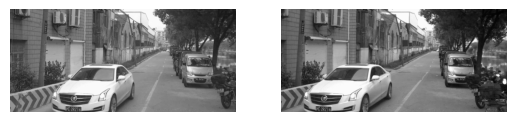

In [246]:
plt.subplot(1,2,1)
plt.imshow(left, cmap='gray')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(right, cmap='gray')
plt.axis('off')
plt.show()

Calculate and show disparity map for a range of block sizes

block size :  5


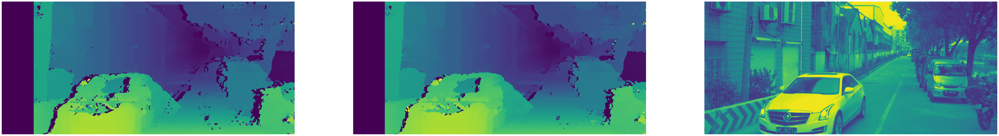

block size :  13


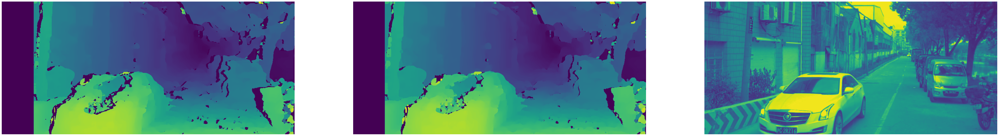

In [247]:
blockSizes = [5,13]
disparity_images = []
eroded_disparity_images = []

# Blur images using gaussian blur
smooth_left = cv2.GaussianBlur(left, (3,3), 1.5)
smooth_right = cv2.GaussianBlur(right, (3,3), 1.5)

kernel = np.array([[1, 1, 1],
                    [1, 1, 1],
                    [1, 1, 1]], np.uint8)


for b in blockSizes:
    stereo = cv2.StereoSGBM_create(minDisparity = 0,numDisparities= 16*6,blockSize=b, P1=8*3*7**2, P2=32*3*7**2, uniquenessRatio=0)

    disparity = stereo.compute(smooth_left, smooth_right).astype(np.float32)/256

    # Disparity map values must be normalized for visualization
    # Using min - max scaling to range [0, 1], and then upscaling values to rnage [0, 255]
    min_value  = disparity.min()
    max_value = disparity.max()

    #disparity = np.uint8(255 * (disparity - min_value) / (max_value - min_value))
    disparity_images.append(disparity)
    eroded_disparity_images.append((cv2.morphologyEx(disparity, cv2.MORPH_DILATE,kernel)))

for i in range(len(disparity_images)):
    print('block size : ', blockSizes[i])
    plt.figure(figsize=(100,100))
    plt.subplot(1,4,1)
    plt.imshow(disparity_images[i])
    plt.axis('off')
    plt.subplot(1,4,2)
    plt.imshow((cv2.morphologyEx(disparity_images[i], cv2.MORPH_DILATE,kernel)))
    plt.axis('off')
    plt.subplot(1,4,3)
    plt.imshow(left)
    plt.axis('off')
    plt.show()


For Generation of Depth map, you have to do : 

z = fb / (xl - xr) = fb / d.

Here, fb is the focal length (obtainable from the camera matrix. \
b is the baseline values corresponding from the translation vectors t. \
d is the disparity map.

Translation : 
 [-0.544915 -0.000155 -0.00226 ]
Projection Left : 
 [[2002.991     0.      905.3329    0.    ]
 [   0.     2002.991   388.5141    0.    ]
 [   0.        0.        1.        0.    ]]
Projection Right : 
 [[ 2002.991      0.       905.3329 -1091.469 ]
 [    0.      2002.991    388.5141     0.    ]
 [    0.         0.         1.         0.    ]]


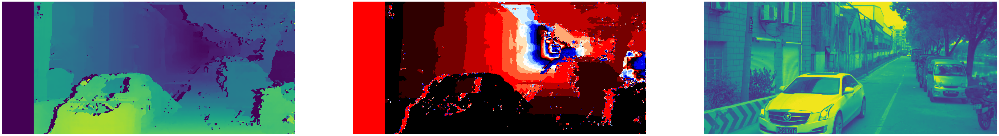

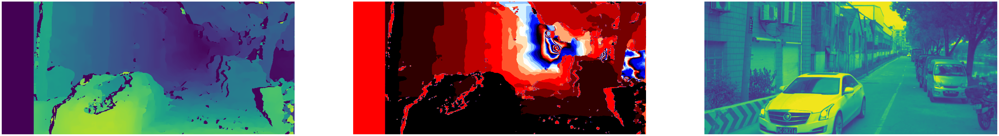

In [266]:
#finding depth
depth_maps = []
depth_map_eroded_disparity = []

i = 0
baseline, fx, fy = parse_calibration_data('../data/stereo/2018-10-31-06-55-01.txt')
for disp in disparity_images:

	disp[disp == 0] = 0.9
	disp[disp == -1] = 0.9

	depth_map = np.ones(disp.shape, dtype=np.float32)

	
	depth_map[:] = (fx * baseline) / disp
	

	plt.figure(figsize=(100,100))
	plt.subplot(1,4,1)
	plt.imshow(disparity_images[i])
	plt.axis('off')
	plt.subplot(1,4,2)
	plt.imshow(depth_map, cmap='flag')
	plt.axis('off')
	plt.subplot(1,4,3)
	plt.imshow(left)
	plt.axis('off')
	plt.show()
	
	fc = np.finfo(np.float32)

	cv2.imwrite('../data/stereo/depth_map.hdr', depth_map)


	i += 1


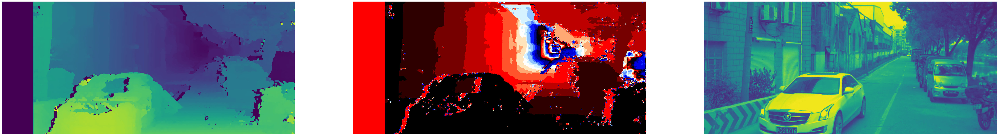

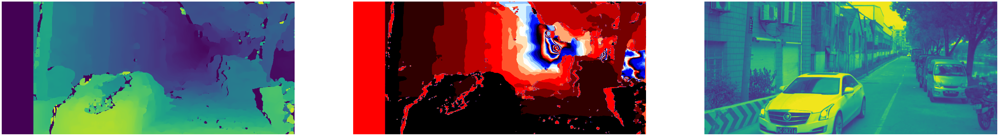

In [ ]:
#finding depth from the eroded depth images.
depth_maps = []
depth_map_eroded_disparity = []

i = 0
for disp in disparity_images:
	
	f = l_camera_matrix[0,0]
	b = r_trans_vect_3d[1] - l_trans_vect_3d[1]

	disp[disp == 0] = 0.9
	disp[disp == -1] = 0.9

	depth_map = np.ones(disp.shape, np.single)
	depth_map[:] = (f * b) / disp
	

	plt.figure(figsize=(100,100))
	plt.subplot(1,4,1)
	plt.imshow(eroded_disparity_images[i])
	plt.axis('off')
	plt.subplot(1,4,2)
	plt.imshow(depth_map, cmap='flag')
	plt.axis('off')
	plt.subplot(1,4,3)
	plt.imshow(left)
	plt.axis('off')
	plt.show()
	i += 1